# Домашняя работа 1
## В данном задании мы будем сжимать звуковую дорожку при помощи алгоритма PCA

In [ ]:
# Понадобится для чтения и записи аудио файлов
from scipy.io import wavfile
from scipy.ndimage import gaussian_filter1d
# Это нужно для проигрывания аудио файлов прямо в блокноте
from IPython.display import Audio, display

# А это набор для этого задания
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import seaborn as sns

In [ ]:
# Скачаем данные
! wget https://www.dropbox.com/s/p5147nr8mzemxnr/Beethoven_Violin_Sonata_Op_96_first_movement_bars_1-22.wav

--2023-03-15 20:35:56--  https://www.dropbox.com/s/p5147nr8mzemxnr/Beethoven_Violin_Sonata_Op_96_first_movement_bars_1-22.wav
Resolving www.dropbox.com (www.dropbox.com)... 162.125.3.18, 2620:100:6018:18::a27d:312
Connecting to www.dropbox.com (www.dropbox.com)|162.125.3.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: /s/raw/p5147nr8mzemxnr/Beethoven_Violin_Sonata_Op_96_first_movement_bars_1-22.wav [following]
--2023-03-15 20:35:57--  https://www.dropbox.com/s/raw/p5147nr8mzemxnr/Beethoven_Violin_Sonata_Op_96_first_movement_bars_1-22.wav
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc5f108f5b4218499a119101dd8c.dl.dropboxusercontent.com/cd/0/inline/B4Sr3Zz2yF5sFNy0h5DzC0ywYxfJL0AfkFDBmMpx-_dIeDwZ5HoUhtKzkYeH6E0wiUmdM_jRCXz3lTCypRKIO5WY3pP-P2E4pl2ZP-cL1TVRToxjIp7rUo-UczzJSupCFlJM_ADZXbA8spwq_DrdMF14y-5ZzQGIyAT7rT6MTd8s9w/file# [following]
--2023-03-15 20:35:57--  https://uc5f108f5

In [ ]:
# Прочитаем аудио дорожку при помощи wavfile
samplerate, data = wavfile.read('Beethoven_Violin_Sonata_Op_96_first_movement_bars_1-22.wav')

`samplerate` есть частота дискретизации - стандартное для аудио значние -- 44100 Гц.

NOTE: **Частота дискретизации** говорит о том, сколько последовательных элементов массива с сигналом кодируют звук длительностью 1 секунда.

Подробнее о кодировании звука [тут](https://ru.wikipedia.org/wiki/Кодирование_звуковой_информации).

In [ ]:
#bytes in kb
kb = 1024

In [ ]:
# Посмотрим какая у нас частота диспретезации
print(samplerate)

44100


In [ ]:
# Если поделить длину массива сигнала на samplerate, получится длительность аудиодорожки в секундах

print(len(data) / samplerate)

# 45 секунд - похоже на правду:)

45.139591836734695


In [ ]:
# Заметим, что звук - стерео, так как сигнал кодируется двумя каналами (для левого и правого динамика):
print(data.shape)

#Посмотрим вес массива
print(data.nbytes/kb**2)

(1990656, 2)
7.59375


In [ ]:
type(data)

numpy.ndarray

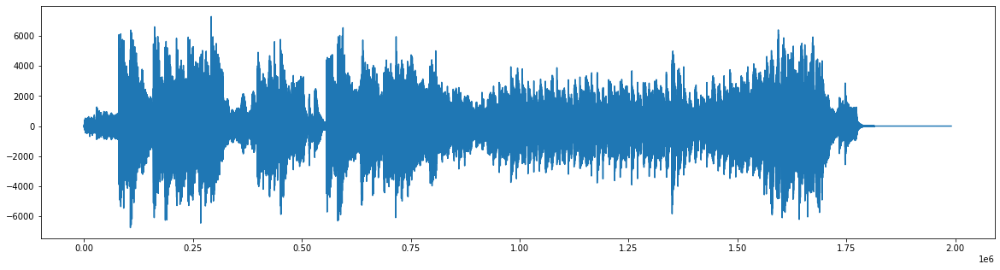

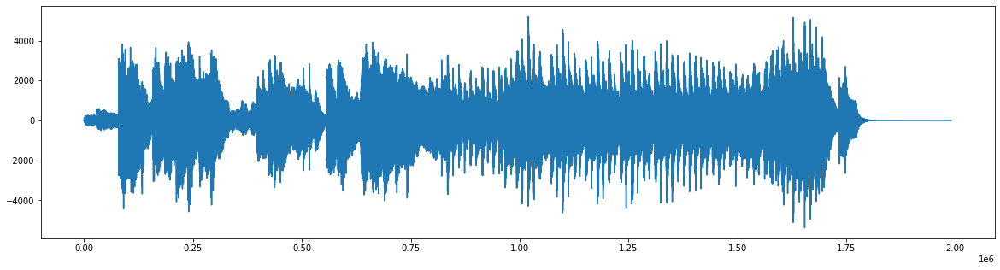

In [ ]:
# Отрисуем сигналы в обоих каналах

# Канал 1
plt.figure(figsize=(20,5))
plt.plot(data[:,0])
plt.show()

# Канал 2
plt.figure(figsize=(20,5))
plt.plot(data[:,1])
plt.show()

In [ ]:
# Усредним каналы, и получим моно звук, с которым будет проще работать

mono_sound = np.mean(data, axis=1)
print(mono_sound.shape)

(1990656,)


In [ ]:
# Давайте послушаем наконец, что же мы будем сжимать:)

Audio(mono_sound, rate = samplerate)

In [ ]:
# Для удобства - обрежем массив с сигналом так, чтобы его было удобнее делить на равные части, датасет из которых и необходимо будет сжать известными вам методами.
# На самом деле способ очень похож на тот, которым мы сжимали картинку, деля её на прямоугольные подкартинки, только здесь задача еще проще)

mono_sound_to_cut = mono_sound[:1990000]
mono_sound_to_cut.shape

(1990000,)

In [ ]:
Audio(mono_sound_to_cut, rate=samplerate)

In [ ]:
# Проверим, что наш звук теперь это просто вектор числе
print(mono_sound_to_cut.shape)

(1990000,)


#### Задание 1:

**Подсказка:** В это задании нужно всего лишь вспомнить как пользоваться методом `.reshape()`


1. Разделите сигнал на равные части (длину каждой части возьмите равной 1000) и соберите из них "датасет", который будет представлять из себя двухменый массив - "матрицу", в которой каждая часть сигнала длины 1000 находится в отдельной строке).

    То есть первая часть содержит первые 1000 чисел сигнала и находится в первой строке матрицы, вторая часть следующие 1000 чисел сигнала и находится во второй строке матрицы и так далее.

    Это также как мы делали с кусочками картинки и получали матрицу размера `(24, 1152000)`!

In [ ]:
#Зададим количество параметров для PCA
comps = 150

In [ ]:
# Ваше решение здесь
new_mono = mono_sound_to_cut.reshape(1990, 1000)
new_mono.shape

#scaler = StandardScaler()
#new_mono = scaler.fit_transform(new_mono)

(1990, 1000)

2. Напишите функцию, которая будет переводить вашу "матрицу" обратно в звуковой сигнал, то есть разворачивать данные обратно из матрицы размера `(число объектов, 1000)` в вектор длины `(число объектов * 1000)`. Проверьте, что все работает верно, путем воспроизведения "востановленного" сигнала -- он должен совпасть в точности с изначальным (ведь им на самом деле и является).

##Нам нужна функция что превращает формат х,у в одномерный умножая х на у и изменяя форму матрицы. 

In [ ]:
# Ваше решение здесь

#multiply matrix axes x*y
mult_shape = lambda x: x[0]*x[1]

def to_sound(matrix:np.array):
  return matrix.reshape(1,mult_shape(matrix.shape))


##Проверим работает ли функция верно, стравнив ее с методом из коробки numpy 

In [ ]:

#check twice if the flattened matrix is equal to transformed by custom func
print(not (to_sound(new_mono) - new_mono.flatten()).any())
print((np.equal(to_sound(new_mono), new_mono.flatten())).all())

True
True


In [ ]:
#convert array into one-dinesional using .flatten()
display(Audio(new_mono.flatten(), rate=samplerate))

#and using custom func
display(Audio(to_sound(new_mono), rate = samplerate))

#### Задание 2

Подсказка: код этого пункта практически полностью совпадает с кодом, который мы использовали на семинаре.

1. Выполните PCA преобразование нашей матрицы, и получите данные, сжатые в пространство меньшей размерности.

    На этом этапе у нас есть наш "датасет" с 1000 "признаками" и мы хотим уменьшить число "признаков" путем применения метода PCA. Число компонент предлагается выбрать вам, но для начала не стоит брать слишком маленькое число, чтобы потом было проще понять, в случае плохого результата -- компонент оказалось недостаточно или вы где-то ошиблись:)


In [ ]:
# Ваше решение здесь


pca = PCA(n_components = comps)
tras_mono = pca.fit_transform(new_mono).astype('int32')


large_int = pca.inverse_transform(tras_mono)          #float64 dtype
inv = pca.inverse_transform(tras_mono).astype('int16')


In [ ]:
#check diff between normalization and without
comps=20
#normalize
scaler = StandardScaler()
X_norm = scaler.fit_transform(new_mono)
#perform pca
pca = PCA(n_components=comps)
X_pca = pca.fit_transform(X_norm)
#inverse pca
X_inv = pca.inverse_transform(X_pca)
#normalize back
X_inv = scaler.inverse_transform(X_inv)
display(Audio(X_inv.flatten(), rate=samplerate))

#without normalization
pca = PCA(n_components=comps)
X_pca = pca.fit_transform(new_mono)
X_inv = pca.inverse_transform(X_pca)
display(Audio(X_inv.flatten(), rate=samplerate))



##Сравним размер оргиинального файла, файла после ПСА и после обратной трнсформации 

In [ ]:

print(f'Original: {data.nbytes/kb}Kb\nafter PCA: {tras_mono.nbytes/kb}Kb\
      \nInverse: {inv.flatten().nbytes/kb}Kb\nInverse(astype): {large_int.nbytes/kb}')



Original: 7776.0Kb
after PCA: 1166.015625Kb      
Inverse: 3886.71875Kb
Inverse(astype): 15546.875


In [ ]:
#Lets listen
inv = inv.flatten()
Audio(inv, rate=samplerate)

###Разница значительная. Стоит отметить так же что имеет значение тип данных в массиве int32( или 16) занимают в несколько раз меньше места чем float64(по умолчанию) без изменения качества звучания. Но это неверно если мы используем нормализацию.

##Напишем несколько функций которые бы работали со списком компонентов и предоставляли визуализацию. Постараемся использовать SOLID принципы и писать вспомогательные функции

In [ ]:
#for convenience of comparing the array size find the size in kbytes
kb_size = lambda x: x.nbytes/kb

In [ ]:
#to have our comparison illustrated we need some functions that find the difference
def get_difference(first, second):
  return round(kb_size(first) / kb_size(second),2)

def get_comp_diff(components, original_num = 1000):
  return round(original_num / components, 2)

In [ ]:
#get some statistics
def get_stats(transformed_sound, inverted_sound, components):
  stat_dict = {
    'datasize' : kb_size(data),
    'trans_size' : kb_size(transformed_sound),
    'inv_size' : kb_size(inverted_sound),
    'o_trans_diff' : get_difference(data, transformed_sound),
    'o_inv_diff' : get_difference(data, inverted_sound),
    'trans_inv_diff' : get_difference(transformed_sound, inverted_sound),
    'comp_diff' : get_comp_diff(components)}
  return stat_dict

In [ ]:
#print the statistics and return it
def print_result(transformed_sound, inverted_sound, components = comps):
  s = get_stats(transformed_sound, inverted_sound, components)
  #first three values never change. due to .astype('int16') 
  #inverted file will always be 2 time smaller than original 
  text = f"Original: {s['datasize']} Kb\
    \nInverted trasformation: {s['inv_size']} Kb\
    \nSize diff orig:inv: {s['o_inv_diff']} times\
    \nafter PCA fit: {s['trans_size']} Kb\
    \nSize diff orig:transf: {s['o_trans_diff']} times\
    \nSize diff transf:inv: {s['trans_inv_diff']} times\
    \nDiff in components: {s['comp_diff']} times\n\n"
  print(text)
  return s

In [ ]:
#main func that performs the transformation there and back. fkuSOLID
def perform_pca(component_num:int, soundfile):
  print('Number of components:', component_num)  
  #normalize
  scaler = StandardScaler()
  sf = scaler.fit_transform(new_mono)
  #pca
  pca = PCA(n_components = component_num)
  trans_sound = pca.fit_transform(sf)
  inverted = pca.inverse_transform(trans_sound)   #.astype('int16') not possible if normalize...wryyy
  #normalize back
  sf = scaler.inverse_transform(inverted)
  sf = sf.flatten()
  print('Noise: ', round(pca.noise_variance_, 2)) #и что эти цифры значат?
  draw_explained_var(pca)
  return trans_sound, sf

In [ ]:
#performs the comparison and creates a audio player
def get_result(n_comps:int, soundfile):
  trans_sound, inverted_trans = perform_pca(n_comps, soundfile)
  display(Audio(inverted_trans, rate = samplerate))
  return trans_sound, inverted_trans

In [ ]:
#show explained variance vs pca_comp_n
def draw_explained_var(pca):
  n = pca.n_components_
  tick = 1 if n < 20 else int(n*0.05)
  plt.figure(figsize = (8,5)) 
  plt.xticks(np.arange(0, n+1, tick))
  plt.plot(np.arange(pca.n_components_)+1, np.cumsum(pca.explained_variance_ratio_))
  plt.grid()
  plt.show()

In [ ]:
#get statistic that interests us
def prepare_stats(stats):
  return stats['trans_size'], stats['o_trans_diff'], stats['comp_diff']


In [ ]:
#creating a dataframe to later show it on hist
def create_df():
  new_df = pd.DataFrame(columns = ['transformed', 'orig_to_trans', 'components difference'])
  new_df.index.name = 'n comps'
  return new_df

In [ ]:
#lets visualize
def draw_barplot(df):
  df2 = df.reset_index()
  ylabel = ['kb', 'kb/times','times']
  fig, axes = plt.subplots(ncols=len(df.columns), figsize=(16,6))
  for n in range(len(df.columns)):
    
    sns.barplot(x = df2.index, y = df[df.columns[n]], ax = axes[n])
    axes[n].set_xticklabels(df.index)
    axes[n].set_xlabel('components')
    axes[n].set_ylabel(ylabel[n])
    axes[n].set_title(df.columns[n])


In [ ]:
def draw_sound(sound_array):
  fig, axes = plt.subplots(ncols=2, figsize=(20,6))
  axes[0].plot(sound_array)
  axes[1].specgram(sound_array)
  plt.show()

In [ ]:
#mainloop
def compare_all(n_comps:list, soundfile = new_mono):
  df = create_df()
  for component in n_comps:
    trans, inv = get_result(component, soundfile)
    draw_sound(inv)
    stats = print_result(trans, inv, component)
    df.loc[component] = prepare_stats(stats)
  draw_barplot(df)
  return df

In [ ]:
#Check on a small list of components if everything works
#compare_all([20])

## Нам нужна функция которая бы пдала нам набор компонентов. Почему бы не использовать последовательность Фибоначчи?

In [ ]:
#lets write a func to create a list of components
def fib(n1,n2):
	while n1+n2 < 1000:
		yield n2
		n1,n2 = n2, n1+n2

In [ ]:
#creating a fkton of values to use a components
mylist = list(fib(1,1))

## Иногда колаб откзазывается запускать весь список с компонентами. Разделим на две части.

In [ ]:
#compare_all(mylist[:len(mylist)//2])

In [ ]:
compare_all(mylist[len(mylist)//2:])

## Проведем операцию на полном списке и сохраним получившийся датафрейм в переменную, чтоб не запускать заново алгоритм и ждать, елси нам просто захочется поменять какую-то визуализацию

In [ ]:
to_draw=compare_all(mylist)

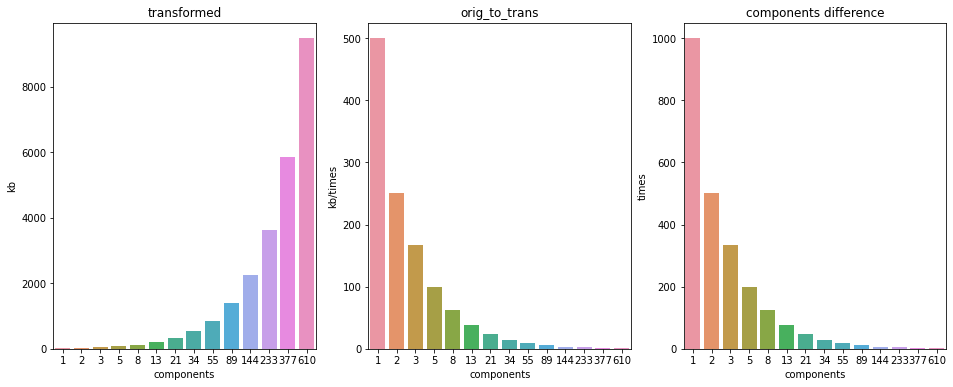

In [ ]:
#if only barplot is required
draw_barplot(to_draw)


2. Постройте сами две главные компоненты в наглядной форме. Сделайте выводы исходя из их вида.

    То есть необходимо применить метод PCA к нашей матрице с числом компонент, равным 2 (тем самым получив датасет с 2 "признаками"). Это позволит нам отрисовать данные на плоскости, чтобы попытаться уловить зависимости.

###Аудио которые получаем, разобрать невозможно на слух. 

/usr/local/lib/python3.9/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:>

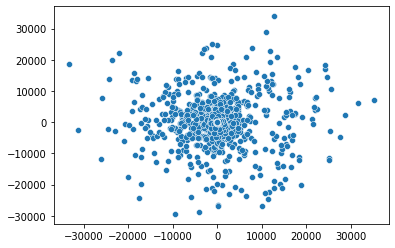

In [ ]:
# Ваше решение здесь

pca_2comp = PCA(n_components = 50) 
two_comp = pca_2comp.fit_transform(new_mono)
transposed = two_comp

sns.color_palette("husl", 9) 
sns.scatterplot(transposed[:, 0], transposed[:, 1])

4809.763175881836


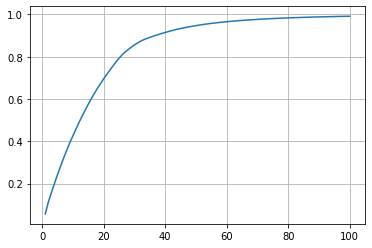

3. Постройте scatter plot датасета в пространстве первых двух компонент, а третью используйте как цвет.
    То есть необходимо применить метод PCA уже с 3 компонентами и нарисовать опять точки, только передав третью компоненту в качестве цвета. (мы также делали на семинаре с картинкой)

/usr/local/lib/python3.9/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:>

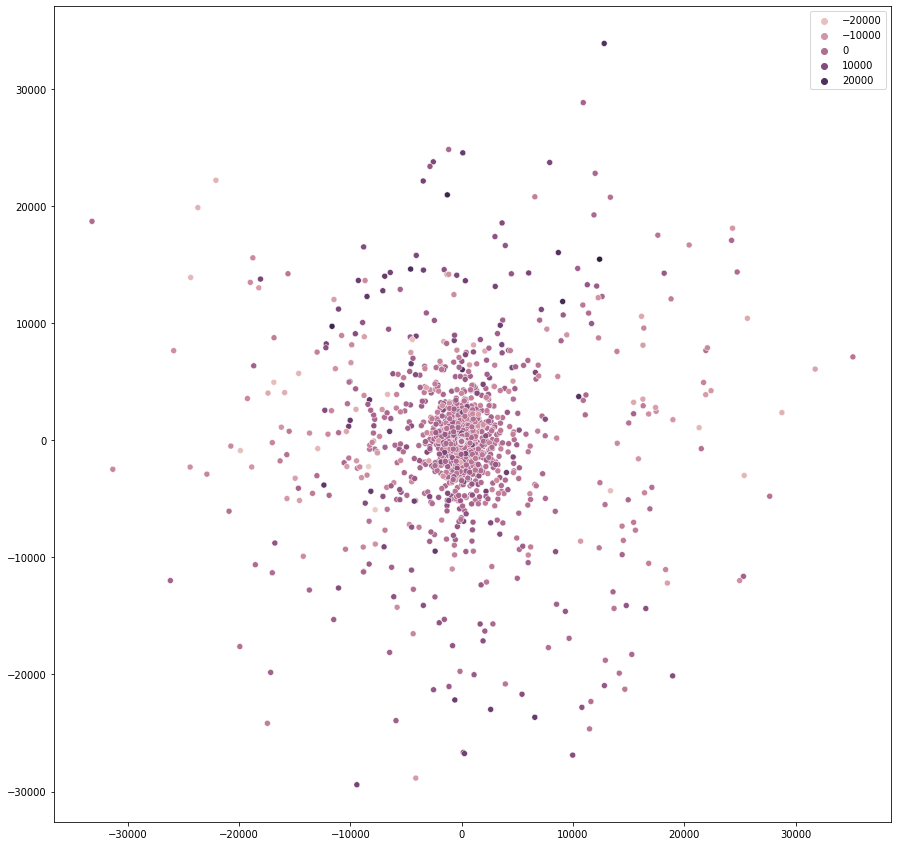

In [ ]:

pca_3comp = PCA(n_components = 3) 
three_comp = pca_3comp.fit_transform(new_mono)
transposed = three_comp

plt.figure(figsize = (15, 15)) 
sns.color_palette("husl", 9) 
sns.scatterplot(transposed[:, 0], transposed[:, 1],hue = transposed[:, 2])

#### Задание 3

Нам осталось заняться непосредственно "сжатием" звука и проверкой правильности наших действий.

1. Выполните обратное PCA преобразование сжатых данных и получите "матрицу" с сжатым звуком.

    Воспользуйтесь обратным преобразованием PCA (inverse_transform), чтобы из матрицы размера `(число объектов, число компонент)` перейти в матрицу размера `(число объектов, 1000)`.

Сделано в предыдущих сегментах.
---



In [ ]:
inv2 = pca_3comp.inverse_transform(transposed)
inv2.shape

(1990, 1000)

2. Преобразуйте "матрицу", получившуюся обратным преобразованием, в сигнал (одномерный массив, наш "сжатый" монозвук), и послушайте результат `(Audio(YOUR_RESULT, rate = samplerate)`.

    Воспользуйтесь функцией, которую написали в первом задании, чтобы преобразовать матрицу с "сжатым" звуком (размер после обратного преобразования должен быть такой же, как и у оригинальной матрицы) в вектор-сигнал, который уже можно будет прослушать. Если звук похож на оригинал, то вы все сделали правильно! 

In [ ]:
# Ваше решение здесь
Audio(to_sound(inv2), rate = samplerate) 
#звук на оригинал не похож в силу слишком маленького количества копонент. остались только басовые партии и духовые.

3. Исследуйте зависимость качества звука от числа компонент. Подберите "на слух" минимальное число компонент, при котором звук практически не отличается от оригинала.

    Добавьте в ячейки два варианта звуковой дорожки -- оригинальную и выбранную вами. Укажите какое число компонент вы оставили.

Подсказка! попробуйте отфильтровать сигнал с помощью функции `gaussian_filter1d` из `scipy.ndimage`. Это поможет убрать неприятный дробовой шум при сильном сжатии

Пример кода для фильтрации - `Audio(gaussian_filter1d(mono_sound_compressed, 2), rate = samplerate)`

### Гауссовая фильтрация не ощущается на малом количестве компонентов ПСА. Качество не очень. Предполагаю что на значениях 50-120 компонент покуда человеческое ухо может слышать разницу фильтр слегка сглаживает звучание



Number of components: 100
Noise:  0.01


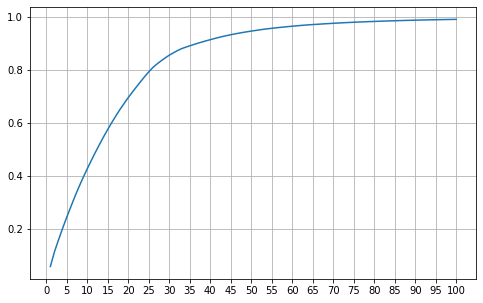

In [ ]:
# Ваше решение здесь

inv3 = perform_pca(100, new_mono)[1]
#display(Audio(new_mono, rate=samplerate))
#display(Audio(inv3, rate = samplerate))
#display(Audio(gaussian_filter1d(inv3, 2), rate = samplerate))


In [ ]:
display(Audio(gaussian_filter1d(inv3, 50), rate = samplerate))


3.1   Ответьте на вопросы: 
- Количество компонент, которое вы выбрали это много или мало? 
- Как сильно можно сжать звук таким образом? 
- А если нам дадут другую звуковую дорожку, нам надо сделать то же самое, чтобы сжать звук, как автоматически подобрать число компонент и возможно ли это?




4811.079015327692


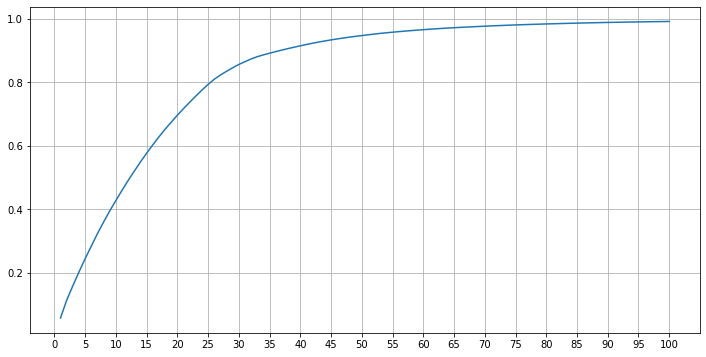

In [ ]:
pca = PCA(n_components=100)
pca.fit(new_mono)
print(pca.noise_variance_)
plt.figure(figsize = (12,6))

plt.xticks(np.arange(0, 101, 5))
plt.plot(np.arange(pca.n_components_)+1, np.cumsum(pca.explained_variance_ratio_))
plt.grid()
plt.show()

3.1. Выбранное количество компонент лежит в промежутке от 75 до 150. ниже 75 и разница в звуке становится слишком сильной, выше 150 ее практически невозможно различить, но исходя из графика соотношение объясненной и общей дисперсий стремится к Y асимптоте 1 где-то с 100 и модель начинает точно обьяснять дисперсию.

Степень сжатия зависит от типа данных, но результаты функции compare_all говорят нам что в разы. при этом отбраная трасформация возращает оригинальный вес с поправкой на тип данных используемых в массиве.
Если нам дадут другу дорожку необходимо понимать в каком состоянии она находится - это может быть и предварительно сжатый файл. Интереса ради пропустим уже измененный файл через ту же процедуру.

In [ ]:
comps = [50,]
compare_all(comps, new_mono)

trans_x,inv_x = perform_pca(50,new_mono)
#И еще раз
compare_all(comps, inv_x.reshape(1990,1000))

Как видим, повторное использование PCA с тем же количеством компонент накиким образом не сказалось на качестве файла (шум  и не изменило его. Свело восстановленный файл к тому же количеству компонент как понижало размерность оригинала.

### Ради лулзов посмотрим на плот и спектрограмму и сгладим сигнал высокими значениями сигмы 

/usr/local/lib/python3.9/dist-packages/matplotlib/axes/_axes.py:7628: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


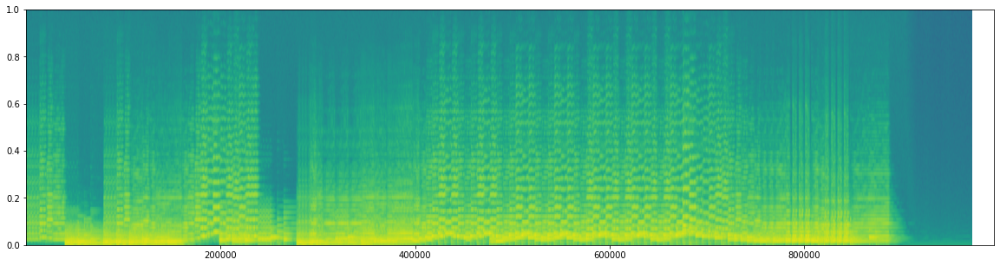

In [ ]:
#оригинальный моно звук
plt.figure(figsize=(20,5))
plt.specgram(mono_sound_to_cut)
plt.show()

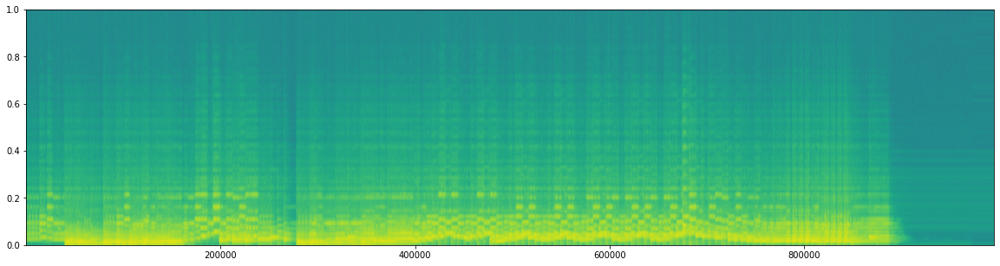

In [ ]:
plt.figure(figsize=(20,5))
plt.specgram(inv3)
plt.show()

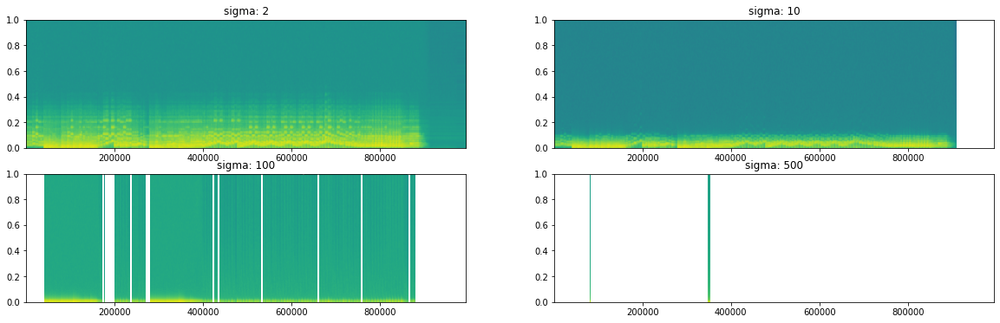

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 6))

sigma = [2,10,100,500]

for n in range(4):
  y = 1 if n>1 else 0
  x = n-2 if n>1 else n
  toplt = gaussian_filter1d(inv3, sigma[n])
  axes[y,x].specgram(toplt)
  axes[y,x].set_title('sigma: '+str(sigma[n]))

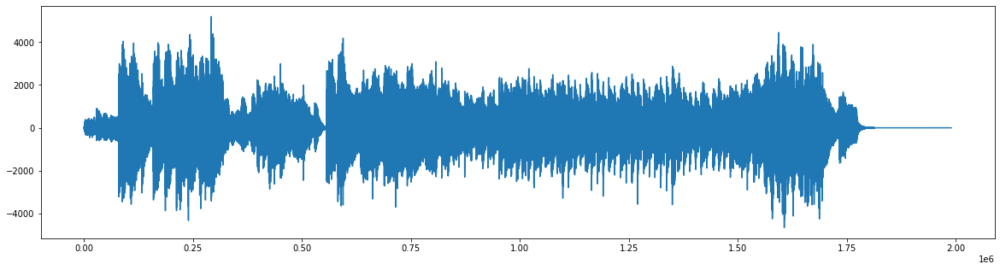

In [ ]:
#Original mono sound line plot
plt.figure(figsize=(20,5))
plt.plot(mono_sound_to_cut)
plt.show()

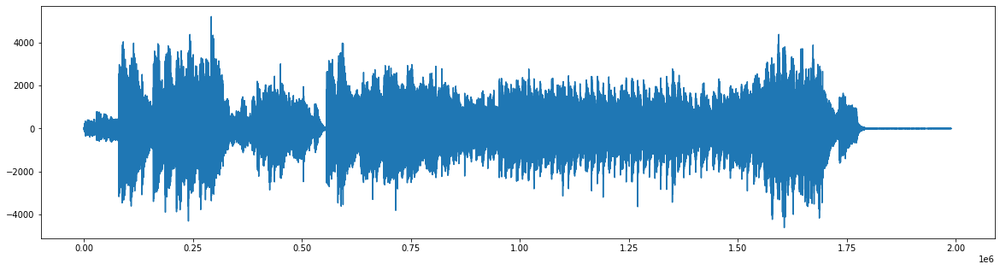

In [ ]:

plt.figure(figsize=(20,5))
plt.plot(inv3)
plt.show()

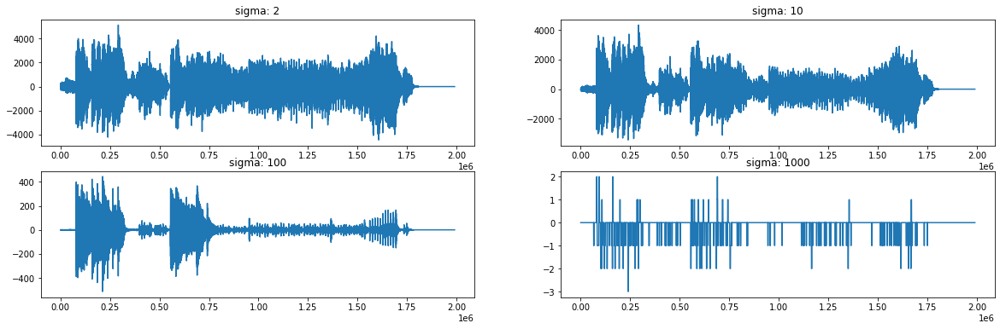

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 6))

sigma = [2,10,100,1000]

for n in range(4):
  y = 1 if n>1 else 0
  x = n-2 if n>1 else n
  toplt = gaussian_filter1d(inv3, sigma[n])
  axes[y,x].plot(toplt)
  axes[y,x].set_title('sigma: '+str(sigma[n]))



4. (доп задание)

  a) Оберните получившийся код по сжатию звука в одну или несколько функций

  b) Проведите исследование того, как степень сжатия (соотношения размера частей, на которые делился сигнал в задании 1.1 к размеру пространсва, в которое вы сжимали данные с помощью PCA) влияет на звук, по субъективным ощущениям. Начиная с какой степени сжания сильно слышится потеря качества? (как с учетом фильтрации с помощью gaussian_filter1d, так и без неё)

  d) Что степень сжатия означает для PCA? Для большой аудиозаписи (3 мин, например) мы хотели бы разбить на большее, меньшее или такое же число отрезков как и для предложенной аудиозаписи? Почему?

  c) Можно ли как-то автоматически подобрать степерь сжатия? За что она отвечает в нашей задаче. Как степень сжатия влияет на звук? Почему она так влияет на звук? 



1. compare_all(mylist) обворачивает и обмазывает функциям код по сжатию звука

2. Результаты изсследвания влияния сжатия звука с PCA и сглаживания фильтрацией:

> 2.1 Исходя из восприятия звука - разницы между 150 и 1000 компонент практически нет.

> 2.2 При 100 компонентах разница уже отчетливо слышится

> 2.3 при гауссовском фильтре с сигмой 2 аудиально качество слегка улучшается

> 2.4 чем больше мы увеличиваем стандартное отклонения для фильтра тем хуже качество поскольку высокая сигма сглаживает сигнал. 

> 2.5 при стандартном отклонении за 50-60 уже почти ничего не слышно, но такое высокое значение STD не имеет смысла

> 2.6 делаем вывод - сглаживание сигнала влияет на громкость

> 2.7. сглаживание не помогает при низких значениях компоненты PCA

3. Степень сжатия файла подразумевает переход векторов в другой базис, но размерность пространства уменьшается. 
Более длинный файл потребует большее количество компонент и логичнее было бы его разрезать на большее количество отрезков. Но использование большего количество отрезков может и негативно сказаться на размерности и затребовать большое количество ресурсов. Кроме того, чем больше будет отрезков, после определенного количество алгоритм может начать оверфитить и результат будет слишком специфичен в данном случае для определенного отрезка. Отчасти можно сказать, что при прочих равных до определенного момента чем больше отрезков тем меньше можно взять компонент, чем больше берем компонент, тем меньше можно делать отрезков.

4. Поскольку подбор количества компонент по сути является подбором гиперпараметров, предполагаю, что анализ результата сложно провести иным способом, помимо эмпирического подхода. Как альтернативый вариант можно предположить, что натренированная сверточная нейронная сеть способна выполнить такую работу и отобрать наиболее правильное количество компонент.

В нашей задаче мы смогли уменьшить размерность и даже вес файла (прежде чем обратной трансформацией предали ему изначальную размерность), при этом при сильном уменьшении количества компонентов страдает качество звучания.

Степень сжатия для ПСА переводит вектора в другой базис, будто бы отсекая (на самом деле нет - переводя в другой базис и "складывая в линию") "лишние" звуки - начиная от самых высоких (они как всплески на спектрограмме), тех которых мы даже не слышим (именно поэтому разница между 1000 и 150 компонент не так заметна - модель способно объяснить абсолютное большинство компонент), в итоге оставляя только низкие партии по типу басовой или духовых. Можно предпложить, что высокий вопль Валерия Кипелова в "Следуй за мной" "исчезнет" раньше чем низкий гроул Стефана Фиори из группы "Graveworm" в кавере на R.E.M "Losing my religion". Если продолжать о голосах - то если постепенно уменьшать количество компонент для треков акапелла группы Van Canto, то в итоге останется только глухой "бубнеж" и ударные. Предполагаю, что в разговоре женщины с высоким голосом(или, скажем, орущего кота) с массивным басовитым мужчиной (или рык крупного кошачьего) первым перестанет быть слышно собеседника номер 1. По аналогии - от громогласного храпа в аудио прежде остальных звуков избавиться не выйдет.